<a href="https://colab.research.google.com/github/Mike030668/MIPT_magistratura/blob/main/RL/FINAL/DZ_3/SB3_AC_fool_env.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# ОПИСАНИЕ

- Данная игра построена на моих первых опытах без картиночной игры в [Дурака](https://github.com/Mike030668/Base_Fool) на моем гитхабе.  Там можно играть с несколькими роботами или их запускать между собой.

- для данного задания решил сделать версию игры на основе основного алгоритма, но уже с картинками и там могут играть между собой:
    - роботы на правила
    - человек и робот
    - и можно человека земенить моделью рандомной.
    
- игра в Дурака на картинках расположена у меня [тут на гитхабе](https://github.com/Mike030668/Base_Fool_images)

- Правила обычного дурака с козырем.
  - Если не можешь или не хочешь, то можно взять карту нажав 0
  - выбираешь номер карты для хода, но если 2 раза не верно, то тоже пропускаешь

- Я добавил еще вывод  ревордов  за неверные шаги и прпуски

Ниже опыт адаптации и обучения моделью A2C из библиотеки `stable-baselines3`

Все ноуты по заданию соберу в папке на гитхабе - https://github.com/Mike030668/MIPT_magistratura/tree/main/RL/FINAL/DZ_3

------

На всякий случай, вначале сделал первое задание, а потом уж решился это начать, ссылка на DZ_1 - https://github.com/Mike030668/MIPT_magistratura/tree/main/RL/FINAL/DZ_1



In [1]:
# prolect
!git clone https://github.com/Mike030668/Base_Fool_images.git -q

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [1]:
import sys
dir_project = '/content/Base_Fool_images'
sys.path.append(dir_project)
from scripts.consruct_game import Durack
from scripts.elements_gane import Razdaza
from IPython.display import display, Image

# SBE and wanb

In [5]:
!pip install stable-baselines3 wandb -q
!pip install shimmy>=0.2.1

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 182.3/182.3 kB 3.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.7/6.7 MB 16.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 953.9/953.9 kB 26.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.3/207.3 kB 26.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 281.1/281.1 kB 28.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 8.3 MB/s eta 0:00:00


## First train

In [2]:
import gymnasium as gym
from gymnasium import spaces
import numpy as np
from IPython.display import Image, display
import random
import os
import matplotlib.pyplot as plt
import imageio
import PIL
import wandb
import torch
from stable_baselines3 import A2C
from stable_baselines3.common.env_checker import check_env
from stable_baselines3.common.callbacks import CheckpointCallback
#from stable_baselines3.common.callbacks import WandbCallback
from wandb.integration.sb3 import WandbCallback

dir_save = "/content/drive/Othercomputers/My_comp/Документы/МФТИ_Наука_о_данных/RL_course/DZ_Final/DZ_3"

class DurakEnv(gym.Env):
    def __init__(self, show_process=False, space_size=13, img_size=(64, 64),
                 img_save_path="obs_img.png", print_out=False, make_gif=False,
                 gif_size = (920, 640)):  # Reduced image size

        self.game = Durack(cards4player=6, humans=1, robots=1,
                           img_path="Base_Fool_images/images",
                           img_save_path=img_save_path,
                           print_out=print_out,
                           plot_game=False,
                           make_gif=False)

        self.players, self.playdeck, self.trump = self.game.init_game()
        self.action_space = spaces.Discrete(space_size)  # 12 cards + 1 for pass
        self.img_size = img_size
        self.observation_space = spaces.Box(low=0, high=255, shape=(img_size[0], img_size[1], 3), dtype=np.uint8)
        self.current_player = 0
        self.done = False
        self.show_process = show_process
        self.type_action = True  # True for step, False for answer
        self.frames = []
        self.img_save_path = img_save_path
        self.state_players = self.game.game_process.make_states(self.players)
        self.model_total_reward = 0
        self.robot_total_reward = 0
        self.PRINT_OUT = print_out
        self.MAKE_GIF = make_gif
        self.gif_size = gif_size

    def reset(self, seed=None, options=None):
        super().reset(seed=seed)

        self.game = Durack(cards4player=6, humans=1, robots=1,
                      img_path="Base_Fool_images/images",
                      img_save_path=self.img_save_path,
                      print_out=self.PRINT_OUT,
                      plot_game=False,
                      make_gif=False)


        self.players, self.playdeck, self.trump = self.game.init_game()
        self.current_player = 0
        self.done = False
        self.type_action = True
        self.frames = []
        self.state_players = self.game.game_process.make_states(self.players)
        self.model_total_reward = 0
        self.robot_total_reward = 0

        self.game.game_process.PLAY = True
        self.game.game_process.TRUMP = self.trump
        self.game.game_process.PLAY_DECK = self.playdeck
        self.game.game_process.START_DECK.loc[self.game.game_process.TRUMP] *= 100

        return self._get_state(), {}

    def step(self, action):
        if self.done:
            return self._get_state(), 0, self.done, False, {}

        reward = 0
        if self.current_player == 0:  # Human player's turn
            action_model = action
        else:
            action_model = None

        player_type = self.game.game_process.get_type(self.players[self.current_player])

        self.players[self.current_player], self.state_players[self.current_player], step_reward = self.game.game_process.action_player(
            self.players[self.current_player], self.state_players[self.current_player], self.type_action, action_model)

        if self.current_player == 0:
            reward += step_reward
            self.model_total_reward += step_reward
        else:
            self.robot_total_reward += step_reward

        self._post_step_updates()

        if self.done:
            winners = [player.name for player, state in zip(self.players, self.state_players) if state[1]]
            if 'Human' in winners[0]:
                reward += 100
                self.model_total_reward += 100
            else:
                self.robot_total_reward += 100

        info = {"model_total_reward": self.model_total_reward, "robot_total_reward": self.robot_total_reward}
        terminated = self.done
        truncated = False  # Assuming truncation is not a condition for this environment

        return self._get_state(), reward, terminated, truncated, info

    def _post_step_updates(self):
        # Check if the game should continue
        if self.state_players[self.current_player][1]:
            self.done = True

        if self.game.game_process.GAME_FIELD.sum().sum() == 0:
            self.type_action = True
        else:
            self.type_action = False

        if (self.players[self.current_player] != 0).sum().sum() < self.game.game_process.CARDS_4PLAYER:
            razdacha_cards = Razdaza(self.game.game_process.PLAY_DECK,
                                     self.game.game_process.CARDS_4PLAYER,
                                     self.game.game_process.GAME_FIELD,
                                     self.game.game_process.BITA,
                                     self.game.game_process.START_DECK,
                                     self.PRINT_OUT)
            self.players, self.game.game_process.PLAY = razdacha_cards(self.players)

        self.current_player = (self.current_player + 1) % len(self.players)
        if self.state_players[self.current_player][1]:
            self.done = True

    def _get_state(self):
        self.game.game_process.display_game_state(
            self.players, self.game.game_process.GAME_FIELD, self.game.game_process.BITA, self.playdeck, self.trump)
        img = PIL.Image.open(self.img_save_path)

        if self.show_process:
            clear_output(True)
            plt.figure(figsize=self.game.game_process.fig_size)
            plt.imshow(img)
            plt.axis("off")
            plt.axis("tight")
            plt.axis("image")
            plt.show()

        img = img.convert("RGB")
        frame = img.resize(self.gif_size)
        frame = np.array(frame)
        img = img.resize(self.img_size)
        img = np.array(img)

        self.frames.append(frame)  # Save frame for GIF
        return img

    def save_gif(self, gif_path="game_play.gif", duration=300):
        if self.MAKE_GIF:
            imageio.mimsave(gif_path, self.frames, duration=duration)

    def _choose_card(self, card_idx):
        player_hand = self.game.game_process.show_cards(self.players[self.current_player], False)
        return player_hand[card_idx][0], player_hand[card_idx][1]

    def _is_done(self):
        return self.players[0].sum().sum() == 0 or self.players[1].sum().sum() == 0

    def _check_winner(self):
        return self.players[0].sum().sum() == 0

In [ ]:
def main():
    wandb.init(project="durak-a2c", entity="mike-puzitskiy", sync_tensorboard=True)
    #wandb.init(project="durak-a2c", sync_tensorboard=True)

    env = DurakEnv(show_process=False, make_gif=False, print_out=False, gif_size=(256, 256))

    # Ensure the environment is correct
    check_env(env)

    # Check if CUDA is available
    device = 'cuda' if torch.cuda.is_available() else 'cpu'

    # Create the model
    model = A2C('CnnPolicy', env, verbose=1, n_steps=5, device=device,
                tensorboard_log= dir_save + "/durak_a2c_tensorboard/")

    # Set up a callback for saving the model at certain intervals
    checkpoint_callback = CheckpointCallback(save_freq=500, save_path= dir_save +'/models/', name_prefix='durak_a2c')

    # Train the model
    #model.learn(total_timesteps=5000, callback=WandbCallback())
    # Train the model with WandB callback
    model.learn(total_timesteps=5000, callback=[checkpoint_callback,
                                                 WandbCallback(gradient_save_freq=100,
                                                               model_save_path= dir_save +"/models", verbose=2)])
    # Save the model
    model.save( dir_save + "/a2c_durak")

    # Load the trained model
    model = A2C.load( dir_save + "/a2c_durak")

    # Test the model
    obs, info = env.reset()
    done = False
    total_reward = 0
    robot_total_reward = 0

    rewards_model = []
    rewards_robot = []

    while not done:
        action, _ = model.predict(obs)
        obs, reward, terminated, truncated, info = env.step(action)
        done = terminated or truncated
        total_reward += reward
        rewards_model.append(info["model_total_reward"])
        rewards_robot.append(info["robot_total_reward"])

    env.save_gif("game_play.gif", duration=500)
    display(Image(filename="game_play.gif"))

    plt.plot(rewards_model, label="Model Total Reward")
    plt.plot(rewards_robot, label="Robot Total Reward")
    plt.xlabel("Steps")
    plt.ylabel("Total Reward")
    plt.legend()
    plt.show()

if __name__ == "__main__":
    main()


<IPython.core.display.Javascript object>

wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit:wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


The number of humans is already set - 1
The number of robots is already set - 1
Trump suit is clubsThe number of humans is already set - 1
The number of robots is already set - 1
Trump suit is diamondsThe number of humans is already set - 1
The number of robots is already set - 1
Player Human_1 skipped the moveThe number of humans is already set - 1
The number of robots is already set - 1
Dealing cards to Robot_1(min)Using cuda device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
Wrapping the env in a VecTransposeImage.
The number of humans is already set - 1
The number of robots is already set - 1
Trump suit is heartsLogging to /content/drive/Othercomputers/My_comp/Документы/МФТИ_Наука_о_данных/RL_course/DZ_Final/DZ_3/durak_a2c_tensorboard/A2C_3
Robot_1(min) made a move hearts_ace
Player Robot_1(min) finished the game
The number of humans is already set - 1
The number of robots is already set - 1
Robot_1(rand) made a move clubs_ace
Player Robot_1(rand) f

The number of participants (robots and humans) should be in total not less than 2 and not more than 6
The number of humans is already set - 1
The number of robots is already set - 1

['Human_1', 'Robot_1(rand)']
rand - robot with random choice of possible cards for the move
min - robot chooses the minimum possible card for the move 

Dealing cards:
Dealing cards to Human_1
Dealing cards to Robot_1(rand)

Trump suit is hearts

Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
Wrapping the env in a VecTransposeImage.
The number of participants (robots and humans) should be in total not less than 2 and not more than 6
The number of humans is already set - 1
The number of robots is already set - 1

['Human_1', 'Robot_1(rand)']
rand - robot with random choice of possible cards for the move
min - robot chooses the minimum possible card for the move 

Dealing cards:
Dealing cards to Human_1
Dealing cards to Robot_1(rand)

Trump suit is diamonds

Your move, Human_1
U

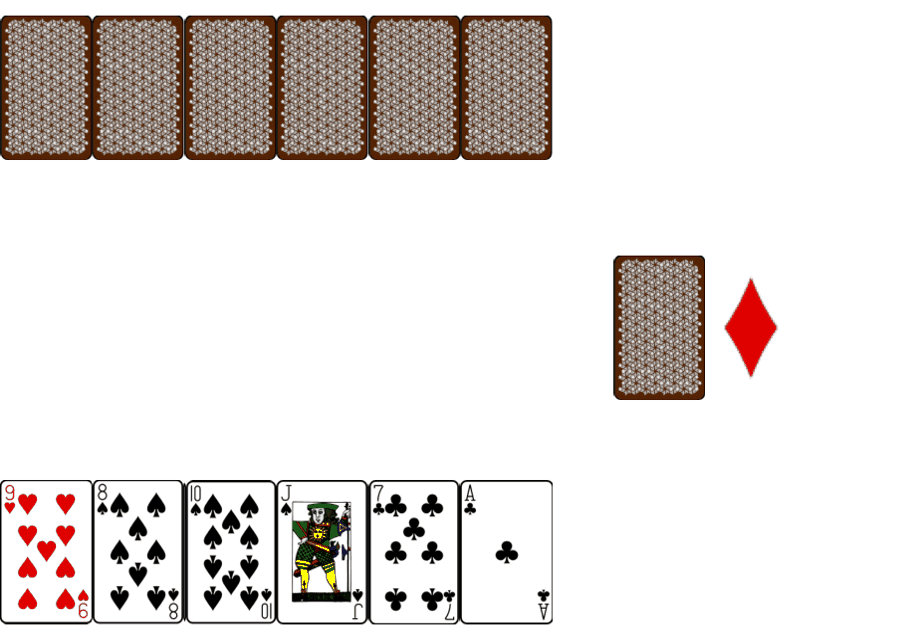

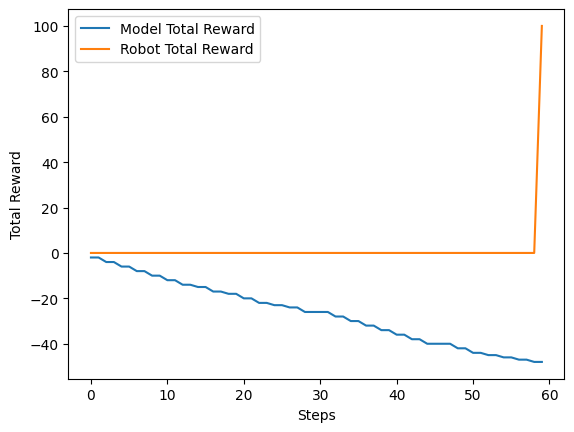

In [7]:
dir_save = "/content/drive/Othercomputers/My_comp/Документы/МФТИ_Наука_о_данных/RL_course/DZ_Final/DZ_3"

# Create the environment
env = DurakEnv(show_process=False, make_gif=True, print_out=True)

# Load the trained model
model = A2C.load(dir_save + "/models/durak_a2c_2500_steps", env=env)

# Test the model
obs, info = env.reset()
done = False
total_reward = 0
robot_total_reward = 0

rewards_model = []
rewards_robot = []

while not done:
    action, _ = model.predict(obs)
    obs, reward, terminated, truncated, info = env.step(action)
    done = terminated or truncated
    total_reward += reward
    rewards_model.append(info["model_total_reward"])
    rewards_robot.append(info["robot_total_reward"])

env.save_gif("game_play.gif", duration=500)
display(Image(filename="game_play.gif"))

plt.plot(rewards_model, label="Model Total Reward")
plt.plot(rewards_robot, label="Robot Total Reward")
plt.xlabel("Steps")
plt.ylabel("Total Reward")
plt.legend()
plt.show()


## Выводы
Средний лосс уменьшается, но намного медленее чем в DQN. И к сожалению пока ни как не могу решить проблему по вылетанию ОЗУ. Для обучения беру минимум 64х64 картинки..

Но в целом как и написал ранее в DQN:
- Построена игра, в которой могут играть и люди и роботы, и построено обучение модели, которая учится играя за человека.

- небольшоt обучениt e;t показывает обучаемость модели уже, так как ее усредненный лосс падает !!!!

## Next train

Проба учить далее

In [ ]:
dir_save = "/content/drive/Othercomputers/My_comp/Документы/МФТИ_Наука_о_данных/RL_course/DZ_Final/DZ_3"

# Check if CUDA is available
device = 'cuda' if torch.cuda.is_available() else 'cpu'

# Create the environment
env = DurakEnv(show_process=False, make_gif=False, print_out=False)

# Load the trained model
model = A2C.load(dir_save + "/models/durak_a2c_2500_steps", env=env, device=device)


wandb.init(project="durak-a2c", entity="mike-puzitskiy", sync_tensorboard=True)

# Ensure the environment is correct
check_env(env)


# Set up a callback for saving the model at certain intervals
checkpoint_callback = CheckpointCallback(save_freq=500, save_path= dir_save +'/models/', name_prefix='durak_a2c')

# Train the model

# Train the model with WandB callback
model.learn(total_timesteps=5000, callback=[checkpoint_callback,
                                              WandbCallback(gradient_save_freq=100,
                                                            model_save_path= dir_save +"/models", verbose=2)])
# Save the model
model.save( dir_save + "/a2c_durak")

# Load the trained model
model = A2C.load( dir_save + "/a2c_durak")

# Test the model
obs, info = env.reset()
done = False
total_reward = 0
robot_total_reward = 0

rewards_model = []
rewards_robot = []

while not done:
    action, _ = model.predict(obs)
    obs, reward, terminated, truncated, info = env.step(action)
    done = terminated or truncated
    total_reward += reward
    rewards_model.append(info["model_total_reward"])
    rewards_robot.append(info["robot_total_reward"])

env.save_gif("game_play.gif", duration=500)
display(Image(filename="game_play.gif"))

plt.plot(rewards_model, label="Model Total Reward")
plt.plot(rewards_robot, label="Robot Total Reward")
plt.xlabel("Steps")
plt.ylabel("Total Reward")
plt.legend()
plt.show()




/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


The number of humans is already set - 1
The number of robots is already set - 1
Trump suit is spadesWrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
Wrapping the env in a VecTransposeImage.


/usr/local/lib/python3.10/dist-packages/notebook/utils.py:280: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  return LooseVersion(v) >= LooseVersion(check)
wandb: Currently logged in as: mike-puzitskiy. Use `wandb login --relogin` to force relogin


The number of humans is already set - 1
The number of robots is already set - 1
Trump suit is heartsThe number of humans is already set - 1
The number of robots is already set - 1
Dealing cards to Human_1The number of humans is already set - 1
The number of robots is already set - 1
Dealing cards to Robot_1(rand)The number of humans is already set - 1
The number of robots is already set - 1
Trump suit is diamondsLogging to /content/drive/Othercomputers/My_comp/Документы/МФТИ_Наука_о_данных/RL_course/DZ_Final/DZ_3/durak_a2c_tensorboard/A2C_4
Robot_1(rand) made a move diamonds_ace
Player Robot_1(rand) finished the game
The number of humans is already set - 1
The number of robots is already set - 1
Robot_1(min) made a move clubs_ace
Player Robot_1(min) finished the game
The number of humans is already set - 1
The number of robots is already set - 1
Robot_1(min) made a move diamonds_ace
Player Robot_1(min) finished the game
The number of humans is already set - 1
The number of robots is al

## Вывод

Не успею уже доучить, но видно, что средний лосс падает далее и далее

Давно хотел переделать первую свою игру под обучение и вот финальное задание в RL к этому сподвигло. Спасибо за опыт!!!!!